In [1]:
%load_ext autoreload
%autoreload 2

import base64
import matplotlib
from io import BytesIO
from skimage import img_as_ubyte

from bokeh.plotting import figure, show, ColumnDataSource, output_notebook
from bokeh.models import HoverTool

output_notebook()

import meerkat as mk
import numpy as np
from meerkat import DataPanel
from meerkat.contrib.imagenette import build_imagenette_dp

Loading BokehJS ...

In [2]:
import torch
import clip
from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

In [3]:
dp = build_imagenette_dp('/Users/krandiash/Desktop/workspace/projects/datasci/data/imagenette/', download=True, version="320px")

In [4]:
dp['clip_img'] = mk.LambdaColumn(dp['img'], lambda x: model.encode_image(preprocess(x).unsqueeze(0).to(device)).squeeze())

In [5]:
@torch.no_grad()
def contains(image, text, threshold=0.5):
    image = preprocess(image).unsqueeze(0).to(device)
    text = clip.tokenize([text]).to(device)
    # text_features = model.encode_text(text)
    logits_per_image, _ = model(image, text)
    logit = logits_per_image.cpu().numpy()[0]
    if logit > threshold:
        return True
    return False

In [6]:
@torch.no_grad()
def query(dp, text):
    column_names = dp.columns

    text = clip.tokenize([text]).to(device)
    

,(ImageColumn)
0,
1,
2,
3,
4,

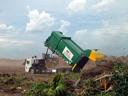
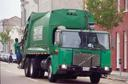
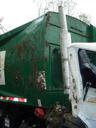
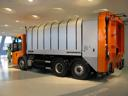
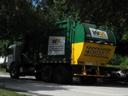

In [7]:
dp.lz[1000:1020].filter(lambda x: contains(x['img'], 'green', threshold=20.), input_columns=['img'])['img']

In [8]:
# Intelligent visualization

## Plots with imagined columns
### Issues to consider:
### - type of plot being generated e.g. 2 variable, 3 variable, plot type (scatter, line, heatmap, tsne, umap)
### - how to express uncertainty in the plot, what kind of uncertainty to express
### - how long it takes to generate the visualization, informing the user of this
### - incremental plotting (e.g. on a random sample) vs. plotting everything
### - caching imagined columns vs. discarding them 

### Example interface
### > dp.plot(x='col1', y=Derive('imag1', 'col1'), hue=Derive('imag2', 'col2'))
### ^ Number of green trucks per image [given: image dp, derive: green truck]
### ^ Correlation with green background per class [given: image dp, derive: green background]
### ^ Number of images available per geolocation [given: image dp, derive: geolocation]

### Derived columns above rely on embeddings. But there are also cases where derived columns could
### be straightforward functions that rely on code generation instead.
### > dp.plot(x='index', y=Code('size of the image', 'image_column'))
### which runs code generation to call im.shape, and then (potentially) plots a histogram since the
### derived data is a tuple (and can be treated as categorical).

In [ ]:
plot(dp, col)

In [9]:
import matplotlib.pyplot as plt

def Derive(target, col, **kwargs):
    """
    Derive target information from a column.
    """
    def _derive(dp):
        """
        Function to take a DataPanel and derive information using a query over embeddings.
        """
        return contains(dp[col], target, threshold=kwargs.get('threshold', 20.))
    
    # Keep information about the query around
    _derive.target = target
    _derive.col = col
    _derive.kwargs = kwargs

    # Return the function to be executed
    return _derive

def hist(dp, y):
    """
    Generate a clever histogram.
    """
    # Derive information
    derived = dp.map(y, input_columns=[y.col])

    # Create labels for the bins in the histogram
    # TODO(karan): generalize, currently assumes binary derived column
    label = derived.copy().astype(object)
    label[derived] = y.target
    label[~derived] = f'not {y.target}'
    
    # Plot the data
    # TODO(karan): currently assumes binary binning, so just plot label directly
    plt.hist(label)



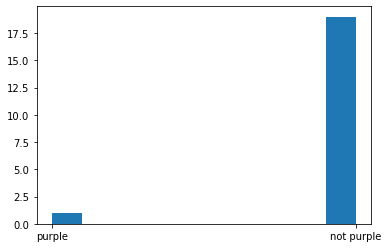

In [10]:
# Histogram: number of images that have purple
hist(dp.head(20), Derive('purple', 'img'))

In [11]:
# Next steps:
# - I see no purple objects in the histogram
#   - I have no reason to suspect otherwise
#        - next: new query
#   - I have reason to suspect that there are purple objects
#       - next: modify query, modify embedding, would like to debug in some way
#       - risk: lose faith
# - I see a few purple objects in the histogram
#   - next: which images/objects were they, are purple images also <insert analysis question>
#   - next: what images were left out but close

In [12]:
# Observation:
# hist(dp, y) will be an expression where
# - y is the name of a column in `dp`
# - y is an expression that evaluates to a column
# Given this, the `hist` function's role is quite simple: evaluate `y` and produce a plot. 
# Said differently, the focus can solely be on adding "intelligence" to the simpler case
# where `dp` already contains the column of interest for which `hist` is being called.
# All of the difficult work is moved to defining a language in which the user can write down 
# functions that evaluate to a column when executed.

In [13]:
# Primitives for writing expressions that evaluate to a column

# Input: existing columns, user input
# Output: column, with type {boolean, numeric, categorical, vector, tensor, image, string, audio, ...}
# Uses: embeddings, models (discriminative, generative)

# any(*expr) where each expr evaluates to a boolean
# all(*expr) where each expr evaluates to a boolean
# not(expr) where each expr evaluates to a boolean

# similar(item_a, item_b): evaluate if item_a is similar to item_b
#       similar(image, text): evaluate if image is similar to text
#       similar(text_a, text_b): evaluate if text_a is similar to text_b
#       similar(image_a, image_b): evaluate if image_a is similar to image_b
# ^ do we need to concern ourselves with "literal" versions of this operation e.g. 
# similar(text_a, text_b) as substring matching?

# mostsimilar(item_a, *items): find item in *items which item_a is most similar to
# leastsimilar(item_a, *items): find item in *items which item_a is least similar to
# label(item, *labels): associate each item with the most probable label
# multilabel(item, *labels): associate each item with the subset of most probable labels

# code(item, text): generate and execute a code snippet on item based on text
# vary(item): generate variations of item
#       vary(text): generate variations of text




In [14]:
# Back to histograms

# Examples
# hist(dp, label('img', 'purple'))
# hist(dp, label('img', vary('purple')))

In [15]:
from typing import Callable


def label(col, labels, **kwargs):

    @torch.no_grad()
    def _label(dp):
        if isinstance(labels, Callable):
            text = labels()
        else:
            text = [labels] if isinstance(labels, str) else labels

        image = dp[col]
        logits_per_image, _ = model(
            preprocess(image).unsqueeze(0).to(device), 
            clip.tokenize(text).to(device)
        )
        logits_per_image = logits_per_image.cpu().numpy()[0]

        if isinstance(labels, Callable):
            # TODO(karan): generalize
            # Assume that the `vary` callable was used; 
            # evaluate similarity for each variant independently
            return list(text[logits_per_image > kwargs.get('threshold', 20.)])
        else:
            # Labels were passed in directly
            if logits_per_image.size > 1:
                # More than one label
                return text[logits_per_image.argmax(-1)]
            else:
                # Single label
                logit = logits_per_image[0]
                if logit > kwargs.get('threshold', 20.):
                    return True
                return False

    # Keep information about the query around
    _label.labels = labels
    _label.col = col
    _label.kwargs = kwargs

    return _label
    

def vary(text): 
    """
    Take a piece of text as input, and return variations of the text.

    Use case(s):
        - when labeling an image with cross-modal embeddings, modifications of the label
            might yield more accurate results e.g. "an image with a purple object" vs. "purple"
            will have different text embeddings, and potentially produce different results.
    """
    # TODO(karan): use a large language model to generate these variations
    # TODO(karan): use model-specific heuristics to generate these variations

    def _vary():
        return np.array([
            text,
            f'an image with {text}',
            f'image with {text}',
            f'a {text} object',
            f'{text} in image',
            f'{text} image',
            f'see {text} above',
            f'see {text} below',
        ])
    
    return _vary

In [16]:
label(dp[0]['img'], vary('purple'))

<function __main__.label.<locals>._label(dp)>

In [17]:
import seaborn as sns
from collections import Counter

def plot(dp, y):
    """
    Generate a clever plot.
    """
    # Derive information
    derived = dp.map(y, input_columns=[y.col])

    print(type(derived))
    if not isinstance(derived, mk.ListColumn) and derived.dtype == bool:
        # Create labels for the bins in the histogram
        # TODO(karan): generalize, currently assumes binary derived column
        label = derived.copy().astype(object)
        label[derived] = y.labels
        label[~derived] = f'not {y.labels}'
        
        # Plot the data
        # TODO(karan): currently assumes binary binning, so just plot label directly
        plt.hist(label)
    
    else:
        counts = dict(Counter([e for l in derived for e in l]))
        for label in y.labels():
            if label not in counts:
                counts[label] = 0
        plt.bar(list(counts.keys()), list(counts.values()))
        plt.xticks(rotation=45, ha='right')
        plt.show()
        plt.close()

        # Correlation matrix
        mat = np.zeros((len(derived), len(counts)))
        for i, l in enumerate(derived):
            for j, k in enumerate(counts):
                if k in l:
                    mat[i, j] = 1
        
        sns.heatmap(np.corrcoef(mat.T), xticklabels=list(counts.keys()), yticklabels=list(counts.keys()), annot=True)


In [18]:
minidp = dp.lz[3872:3892]

<class 'meerkat.columns.numpy_column.NumpyArrayColumn'>


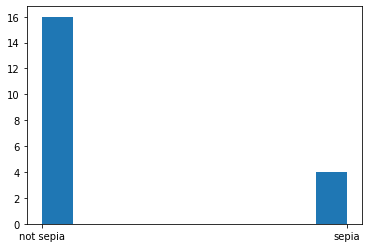

In [19]:
plot(dp=minidp, y=label('img', 'sepia'))

In [20]:
# Shreya's Feedback
# The operation feels unintuitive, and it's hard to tell what kind of labeling is being done
# e.g. are we labeling if all objects in the image are sepia, is labeling segmenting it too, are we doing it noisily,
# is the output binary, etc.
# Alternately suggested adding modifiers to make the expression easier to read
# plot(dp=minidp, y=label('img', binary('sepia'))) indicating that we're doing binary labeling for sepia / no sepia

<class 'meerkat.columns.list_column.ListColumn'>


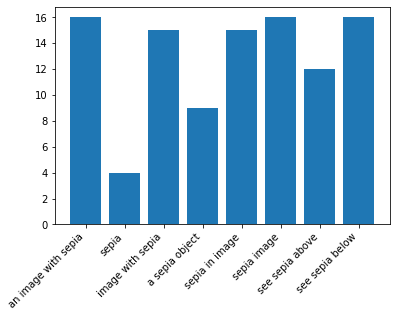

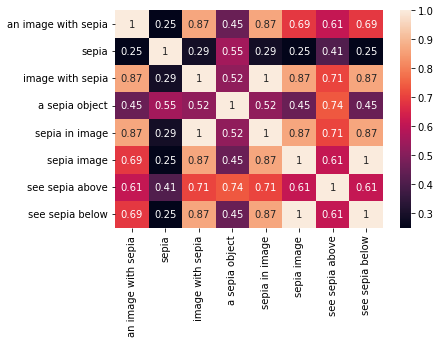

In [21]:
plot(minidp, label('img', vary('sepia')))

<class 'meerkat.columns.list_column.ListColumn'>


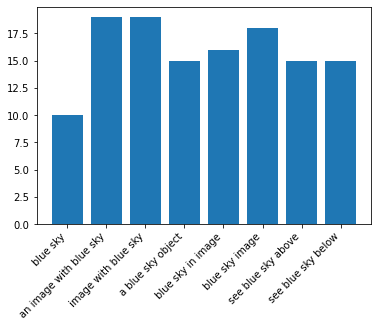

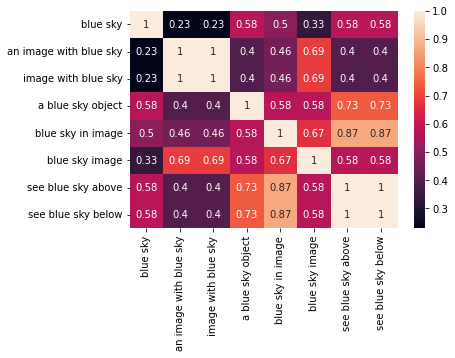

In [22]:
plot(minidp, label('img', vary('blue sky')))

In [23]:
# This doesn't work, even though it should?
# label('img', 'sepia')(minidp)
# This works
minidp.map(label('img', 'sepia'))

,(NumpyArrayColumn)
0,False
1,True
2,False
3,True
4,False
...,...
15,False
16,False
17,False
18,False


In [24]:
minidp.map(label('img', vary('sepia')))

,(ListColumn)
0,['an image with sepia']
1,"['sepia', 'an image with sepia', 'image with sepia', 'a sepia object', 'sepia in image', 'sepia image', 'see sepia above', 'see sepia below']"
2,"['an image with sepia', 'image with sepia', 'sepia in image', 'sepia image', 'see sepia below']"
3,"['sepia', 'an image with sepia', 'image with sepia', 'a sepia object', 'sepia in image', 'sepia image', 'see sepia above', 'see sepia below']"
4,"['an image with sepia', 'image with sepia', 'sepia in image', 'sepia image', 'see sepia above', 'see sepia below']"
...,...
15,"['an image with sepia', 'image with sepia', 'a sepia object', 'sepia in image', 'sepia image', 'see sepia above', 'see sepia below']"
16,[]
17,"['an image with sepia', 'image with sepia', 'sepia in image', 'sepia image', 'see sepia above', 'see sepia below']"
18,"['an image with sepia', 'image with sepia', 'sepia in image', 'sepia image', 'see sepia below']"


In [ ]:
# 2D scatter plot, with hue as the images

In [194]:
import matplotlib.cm as cm

def to_png(arr):
    out = BytesIO()
    im = Image.fromarray(arr)
    im.save(out, format='png')
    return out.getvalue()

def b64_image_files(images, colormap='magma'):
    urls = []
    for im in images:
        png = to_png(img_as_ubyte(im))
        url = 'data:image/png;base64,' + base64.b64encode(png).decode('utf-8')
        urls.append(url)
    return urls

In [203]:
source = ColumnDataSource(
        data=dict(
            # x=[1, 2, 3, 4, 5],
            # y=[2, 5, 8, 2, 7],
            x=minidp.map(label('img', 'sepia')),
            y=minidp.map(label('img', 'church interior')),
            desc=['A', 'b', 'C', 'd', 'E'] * 4,
            imgs=b64_image_files(minidp.lz['img']),
            heights=minidp.lz['img'].map(lambda x: x.size[0]) / 2.,
            widths=minidp.lz['img'].map(lambda x: x.size[1]) / 2.,
        )
    )

hover = HoverTool(
        tooltips="""
        <div>
            <div>
                <img
                    src="@imgs" height="@heights" alt="@imgs" width="@widths"
                    style="float: left; margin: 0px 15px 15px 0px;"
                    border="2"
                ></img>
            </div>
            <div>
                <span style="font-size: 17px; font-weight: bold;">@desc</span>
                <span style="font-size: 15px; color: #966;">[$index]</span>
            </div>
            <div>
                <span style="font-size: 15px;">Location</span>
                <span style="font-size: 10px; color: #696;">($x, $y)</span>
            </div>
        </div>
        """
    )

p = figure(
    plot_width=500, 
    plot_height=500, 
    tools=[hover], 
    title="Mouse over the dots",
)

p.circle('x', 'y', size=20, source=source)

show(p)

In [ ]:
# Generate a 2D scatter plot, where hovering shows the image
plot(minidp, x=label('img', 'sepia'), y=label('img', 'church interior'), hover='img')

,(ListColumn)
0,
1,
2,
3,
4,

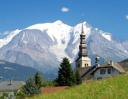
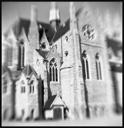
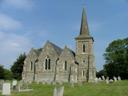
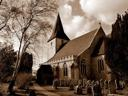
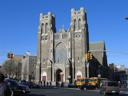

In [206]:
minidp['img'][:5]

In [343]:
# Phrases where Label + SVD helps: ['inside a church']

text = clip.tokenize(['green grass']).to(device)
text_features = model.encode_text(text).detach().numpy()

image_features = minidp.lz['clip_img'][0]

In [344]:
from sklearn.decomposition import TruncatedSVD

In [345]:
A = np.concatenate([minidp.lz['clip_img'][[0, 7]].detach().numpy(), text_features], axis=0)
svd = TruncatedSVD(3)
svd.fit(A)
B = svd.transform(minidp.lz['clip_img'][:].detach().numpy())
C = svd.transform(text_features)

In [346]:
np.argsort(B.flatten())

array([ 2,  1, 22, 25, 55, 34, 10, 28, 58, 19, 43, 52, 40, 35,  7, 46,  4,
       16, 49, 31, 13, 37, 20, 38, 26, 56,  5, 53, 29, 32, 11, 59, 50, 14,
       17,  8, 41, 44, 47, 23, 12, 36, 48, 15, 30,  3, 24, 51,  6, 39, 27,
       42, 54, 18, 45, 57,  9, 33, 21,  0])

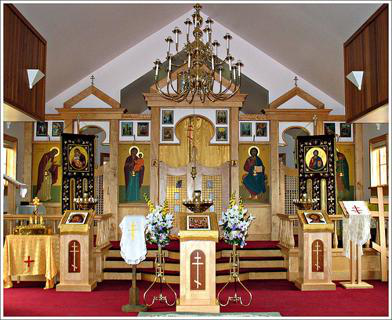

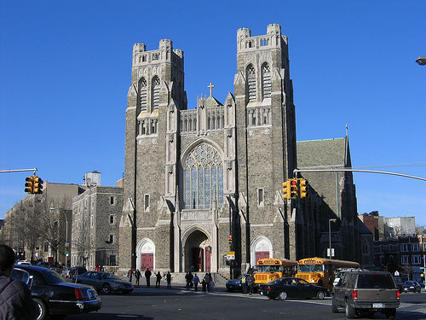

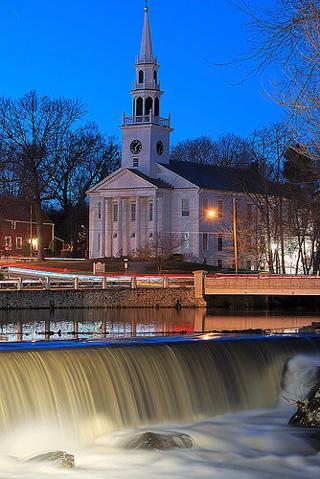

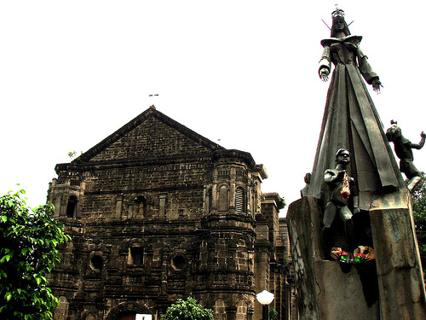

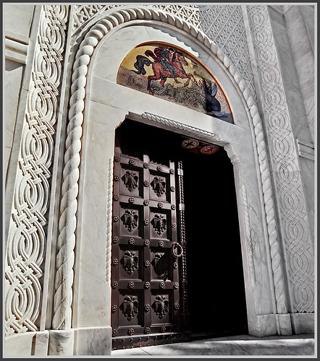

...

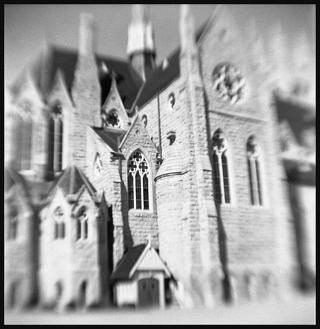

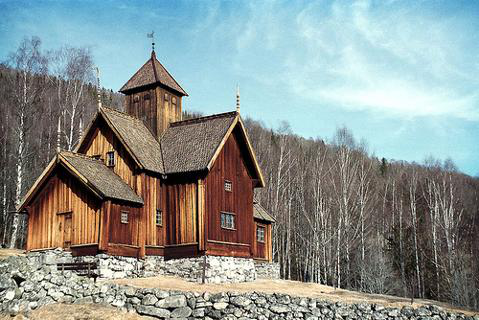

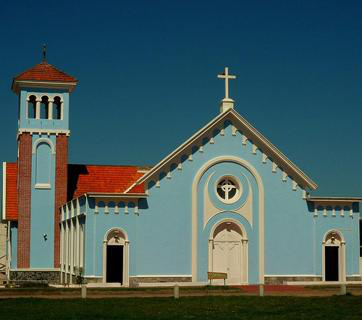

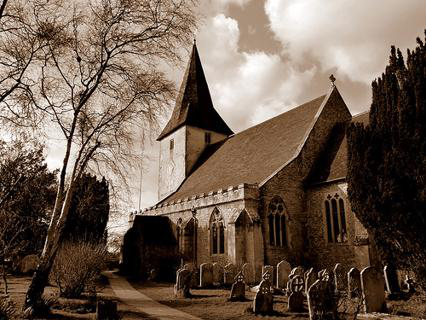

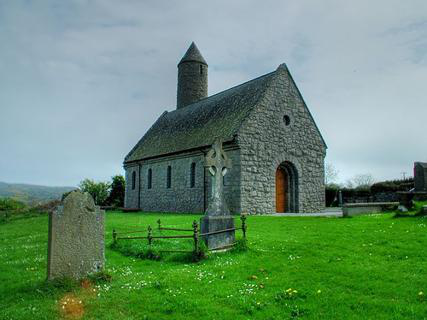

In [347]:
from IPython.display import display
for im in minidp.lz[np.argsort((B @ C.T).flatten())]['img']:
    display(im)

,(ImageColumn)
0,
1,
2,
3,
4,
...,...
15,
16,
17,
18,

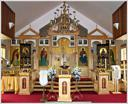
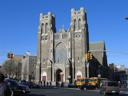
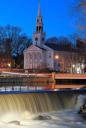
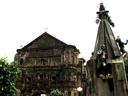
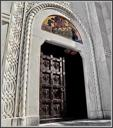
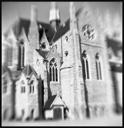
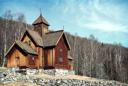
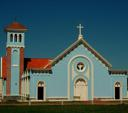
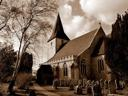
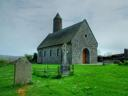

In [348]:
minidp.lz[np.argsort((B @ C.T).flatten())]['img']

In [349]:
B @ C.T

array([[19.874298],
       [20.493149],
       [19.417936],
       [21.109774],
       [16.19376 ],
       [19.053007],
       [20.092287],
       [18.563854],
       [15.426143],
       [17.80345 ],
       [19.8733  ],
       [20.8054  ],
       [17.442492],
       [19.068827],
       [20.084538],
       [22.381765],
       [16.966393],
       [18.036291],
       [18.676792],
       [21.014174]], dtype=float32)

In [350]:
minidp.lz['clip_img'][:].detach().numpy() @ text_features.squeeze()

array([19.874306, 20.493164, 19.417942, 21.109781, 16.19376 , 19.053013,
       20.09229 , 18.563858, 15.426156, 17.803476, 19.8733  , 20.805391,
       17.4425  , 19.068832, 20.084541, 22.381773, 16.966398, 18.036287,
       18.676805, 21.014177], dtype=float32)

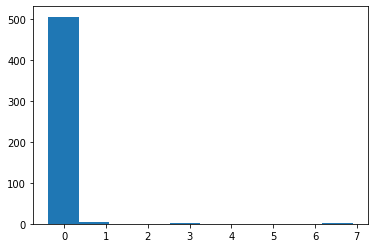

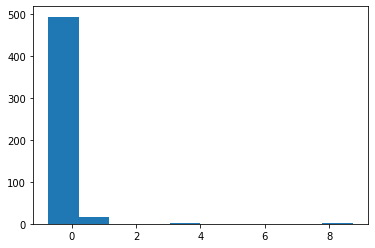

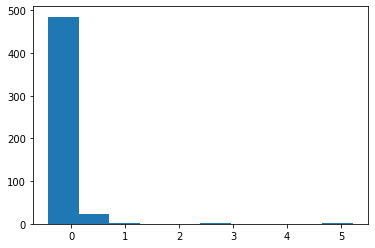

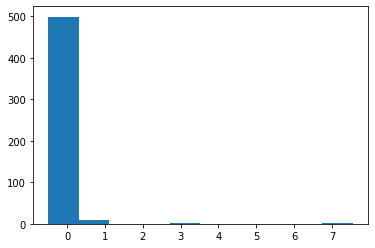

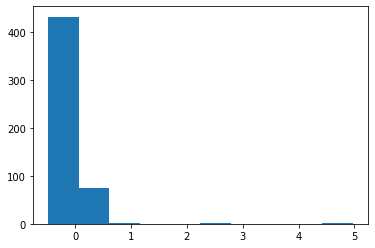

In [229]:
for z in minidp.lz['clip_img'][:5].detach().numpy() * text_features.squeeze().detach().numpy():
    plt.hist(z)
    plt.show()

(array([505.,   4.,   0.,   0.,   2.,   0.,   0.,   0.,   0.,   1.]),
 array([-0.38234735,  0.34591734,  1.074182  ,  1.8024467 ,  2.5307114 ,
         3.258976  ,  3.9872408 ,  4.7155056 ,  5.4437704 ,  6.1720347 ,
         6.9002995 ], dtype=float32),
 <BarContainer object of 10 artists>)

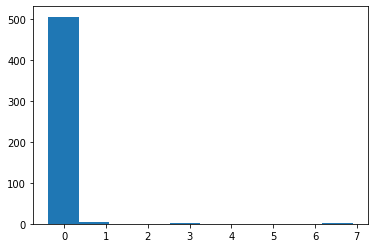

In [220]:
plt.hist((image_features * text_features.squeeze()).detach().numpy())

In [223]:
image_features @ text_features.squeeze()

tensor(14.2343, grad_fn=<DotBackward0>)

In [ ]:
# what are the other ways to do this?
# why don't conventional code and abstractions solve this problem?


In [ ]:
def column_exists(dp, x):
    """
    Check if `x` is a column in the datapanel `dp`.
    """
    if isinstance(x, str):
        return x in dp.columns
    return False

def plot(dp, x, y=None, hue=None, hover=None):
    """
    Clever plotting function.
    """
    x_exists = column_exists(dp, x)

    # General structure
    # Check which inputs are passed in
    # Case on the type of the inputs
    # Calculate all the necessary data
    # Figure out what plots are admissible
    # Plot

    if x_exists:
        # Get the data lazily
        x_data = dp.lz[x]
    else:
        # Calculate the outputs
        x_data = dp.map(x)

    
    # Check the type of x
    if isinstance(x_data, torch.Tensor):
        
    



In [ ]:
plot(minidp, 'img')
plot(minidp, umap('img'))
plot(minidp, tsne('img'))
plot(minidp, pca('img'))

plot(minidp, label('img', binary('sepia')), incremental=True, type='scatter')

plot(minidp, segment('img', ['dog', 'cat', 'dinosaur']))
plot(minidp, bbox('img', ['dog', 'cat', 'dinosaur']))
plot(minidp, label('img', similarity('sepia')), crop('img', ['dog', 'cat', 'dinosaur']))



In [28]:
minidp.map(label('img', 'sepia'))

TypeError: img should be PIL Image. Got <class 'meerkat.columns.image_column.ImageColumn'>